# Clean raw data

## Libraries

Data wrangling and visualization.

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import re

pd.options.display.max_columns = 50
%matplotlib inline
plt.style.use("bmh")
sns.set()

## Import data

Query the data from Elasticsearch. Alternatively you can load the *processed_tweets.csv* file.

In [2]:
from elasticsearch import Elasticsearch

es = Elasticsearch("http://localhost:9200")

In [3]:
from elasticsearch_dsl import Search
from elasticsearch_dsl import connections

connections.create_connection(hosts=["localhost"])

s = Search(using = es, index = "tweets_sentiment")
response = s.scan()

count = 0
processed_records = []
for hit in response:
    processed_records.append(hit.to_dict())
    #print(hit.to_dict())  # be careful, it will printout every hit in your index
    count += 1

print(count)

1018


## DataFrame modifications

In [4]:
df = pd.DataFrame.from_dict(processed_records)

In [5]:
df.head(10)

,Tweet_Id,Datetime,Text,Likes,Retweets,Location,Cancel,Pedophilia,QAnon,Clean_tweets,Processed_tweets,Sentiment
0,1598466952309211136,2022-12-01T23:59:54+00:00,"If y’all are throwing out any Balenciaga, espe...",2,0,"Los Angeles, CA",0,0,0,if y’all are throwing out any balenciaga espec...,y’all throwing especially size l shis size sho...,negative
1,1598466908008980480,2022-12-01T23:59:43+00:00,#75 live at 8pm EST on this page. So many thin...,0,0,Montreal,0,0,0,live at est on this page so many things to ta...,live est page many thing talk including climat...,neutral
2,1598466875947880448,2022-12-01T23:59:35+00:00,@BaileyUnspoken @RealTalkPerson @KimKardashian...,0,0,Riverside Estates,0,0,0,but she literally only wears balenciaga if...,literally wear done something le serious could...,negative
3,1598466874303463426,2022-12-01T23:59:35+00:00,@kanyewest DEMNA! Lead Designer of Balenciaga!...,0,0,"Houston, TX",0,0,0,demna lead designer of balenciaga get him out,demna lead designer get,neutral
4,1598466848319750144,2022-12-01T23:59:29+00:00,Kanye out here burying Balenciaga news tired 😴,0,0,"Manchester, England",0,0,0,kanye out here burying balenciaga news tired 😴,kanye burying news tired 😴,negative
5,1598466846080262144,2022-12-01T23:59:28+00:00,Thank God I didn’t end up buying them balencia...,0,0,Sydney / Nairobi / Harare,0,0,0,thank god i didn’t end up buying them balencia...,thank god didn’t end buying sneaker last year,neutral
6,1598466840992579584,2022-12-01T23:59:27+00:00,@mmpadellan With the drama at Balenciaga and D...,3,0,Other,0,1,0,with the drama at balenciaga and democrats ma...,drama democrat mad elon musk removing pedo sig...,negative
7,1598466839293599745,2022-12-01T23:59:27+00:00,@kanyewest We love Demna. He's not Balenciaga ...,0,0,Other,0,0,0,we love demna hes not balenciaga ceo,love demna he ceo,positive
8,1598466829797687298,2022-12-01T23:59:24+00:00,@vikare06 Looks like a balenciaga photo shoot,2,0,Hyde Park,0,0,0,looks like a balenciaga photo shoot,look like photo shoot,neutral
9,1598466786244317184,2022-12-01T23:59:14+00:00,@DestinyVaughn @M4D3R0 @ksenijapavlovic @Mikha...,0,0,"New York, NY / Manahatta",0,0,0,the photos are above,photo,neutral


### Datetime

In [6]:
df["Datetime"] = pd.to_datetime(df["Datetime"], format = "%Y-%m-%dT%H:%M:%S%z")

In [7]:
#df["Location"] = df["Location"].replace("Other",np.nan,regex = True)

In [15]:
#df["Location"] = df["Location"].fillna("")

In [13]:
df.isnull().sum()

Tweet_Id            0
Datetime            0
Text                0
Likes               0
Retweets            0
Location            0
Cancel              0
Pedophilia          0
QAnon               0
Clean_tweets        0
Processed_tweets    0
Sentiment           0
dtype: int64

In [14]:
df.head(10)

,Tweet_Id,Datetime,Text,Likes,Retweets,Location,Cancel,Pedophilia,QAnon,Clean_tweets,Processed_tweets,Sentiment
0,1598466952309211136,2022-12-01T23:59:54+00:00,"If y’all are throwing out any Balenciaga, espe...",2,0,"Los Angeles, CA",0,0,0,if y’all are throwing out any balenciaga espec...,y’all throwing especially size l shis size sho...,negative
1,1598466908008980480,2022-12-01T23:59:43+00:00,#75 live at 8pm EST on this page. So many thin...,0,0,Montreal,0,0,0,live at est on this page so many things to ta...,live est page many thing talk including climat...,neutral
2,1598466875947880448,2022-12-01T23:59:35+00:00,@BaileyUnspoken @RealTalkPerson @KimKardashian...,0,0,Riverside Estates,0,0,0,but she literally only wears balenciaga if...,literally wear done something le serious could...,negative
3,1598466874303463426,2022-12-01T23:59:35+00:00,@kanyewest DEMNA! Lead Designer of Balenciaga!...,0,0,"Houston, TX",0,0,0,demna lead designer of balenciaga get him out,demna lead designer get,neutral
4,1598466848319750144,2022-12-01T23:59:29+00:00,Kanye out here burying Balenciaga news tired 😴,0,0,"Manchester, England",0,0,0,kanye out here burying balenciaga news tired 😴,kanye burying news tired 😴,negative
5,1598466846080262144,2022-12-01T23:59:28+00:00,Thank God I didn’t end up buying them balencia...,0,0,Sydney / Nairobi / Harare,0,0,0,thank god i didn’t end up buying them balencia...,thank god didn’t end buying sneaker last year,neutral
6,1598466840992579584,2022-12-01T23:59:27+00:00,@mmpadellan With the drama at Balenciaga and D...,3,0,Other,0,1,0,with the drama at balenciaga and democrats ma...,drama democrat mad elon musk removing pedo sig...,negative
7,1598466839293599745,2022-12-01T23:59:27+00:00,@kanyewest We love Demna. He's not Balenciaga ...,0,0,Other,0,0,0,we love demna hes not balenciaga ceo,love demna he ceo,positive
8,1598466829797687298,2022-12-01T23:59:24+00:00,@vikare06 Looks like a balenciaga photo shoot,2,0,Hyde Park,0,0,0,looks like a balenciaga photo shoot,look like photo shoot,neutral
9,1598466786244317184,2022-12-01T23:59:14+00:00,@DestinyVaughn @M4D3R0 @ksenijapavlovic @Mikha...,0,0,"New York, NY / Manahatta",0,0,0,the photos are above,photo,neutral


## Import csv

In [9]:
#df = pd.read_csv("processed_tweets.csv", sep=",", index = False)

## EDA

### Show a tweet's sentiment

In [10]:
display(df[df["Sentiment"] == "positive"].head(10))
display(df[df["Sentiment"] == "neutral"].head(10))
display(df[df["Sentiment"] == "negative"].head(10))

,Tweet_Id,Datetime,Text,Likes,Retweets,Location,Cancel,Pedophilia,QAnon,Clean_tweets,Processed_tweets,Sentiment
7,1598466839293599745,2022-12-01 23:59:27+00:00,@kanyewest We love Demna. He's not Balenciaga ...,0,0,Other,0,0,0,we love demna hes not balenciaga ceo,love demna he ceo,positive
49,1598466231606067201,2022-12-01 23:57:02+00:00,@samanthamarika1 Apple and Balenciaga are prob...,0,0,Other,0,0,0,apple and balenciaga are probably so happy ri...,apple probably happy right,positive
51,1598466202539790336,2022-12-01 23:56:55+00:00,@CitizenFreePres @ParleUSA Interesting. Just v...,1,0,Clown world,0,0,0,interesting just viue signaling because bale...,interesting viue signaling already money,positive
54,1598466178921467910,2022-12-01 23:56:49+00:00,"@BetteMidler I love your music, your charisma ...",0,0,Other,0,0,0,i love your music your charisma and your acti...,love music charisma acting style bette please ...,positive
64,1598465957651177472,2022-12-01 23:55:57+00:00,"@MikhailaFuller Alexis Hellmer, probably one o...",0,0,Los Angeles,0,0,0,alexis hellmer probably one of the finest lat...,alexis hellmer probably one finest latinist am...,positive
67,1598465910771269634,2022-12-01 23:55:45+00:00,@TheBabylonBee Of course Baal responds before ...,1,0,Other,0,0,0,of course baal responds before balenciaga 😂 k...,course baal responds 😂 keep good work bee 👍,positive
82,1598465747319414785,2022-12-01 23:55:06+00:00,@barnes_law Whilst wearing Balenciaga. Nice.,0,0,"Australia, USA",0,0,0,whilst wearing balenciaga nice,whilst wearing nice,positive
83,1598465689748000768,2022-12-01 23:54:53+00:00,There has been new developments in the atelier...,0,0,Other,0,0,0,there has been new developments in the atelier...,new development atelier could exciting thing c...,positive
88,1598465453810225154,2022-12-01 23:53:56+00:00,So we’ve finally agreed to bin off Balenciaga?...,0,0,"London, England",0,0,0,so we’ve finally agreed to bin off balenciaga ...,we’ve finally agreed bin time tetri trainer,positive
172,1598463664012800002,2022-12-01 23:46:50+00:00,"Hey Balenciaga, great replacement for your spo...",0,0,Other,0,0,0,hey balenciaga great replacement for your spok...,hey great replacement spokesperson kimkardashi...,positive


,Tweet_Id,Datetime,Text,Likes,Retweets,Location,Cancel,Pedophilia,QAnon,Clean_tweets,Processed_tweets,Sentiment
1,1598466908008980480,2022-12-01 23:59:43+00:00,#75 live at 8pm EST on this page. So many thin...,0,0,Montreal,0,0,0,live at est on this page so many things to ta...,live est page many thing talk including climat...,neutral
3,1598466874303463426,2022-12-01 23:59:35+00:00,@kanyewest DEMNA! Lead Designer of Balenciaga!...,0,0,"Houston, TX",0,0,0,demna lead designer of balenciaga get him out,demna lead designer get,neutral
5,1598466846080262144,2022-12-01 23:59:28+00:00,Thank God I didn’t end up buying them balencia...,0,0,Sydney / Nairobi / Harare,0,0,0,thank god i didn’t end up buying them balencia...,thank god didn’t end buying sneaker last year,neutral
8,1598466829797687298,2022-12-01 23:59:24+00:00,@vikare06 Looks like a balenciaga photo shoot,2,0,Hyde Park,0,0,0,looks like a balenciaga photo shoot,look like photo shoot,neutral
9,1598466786244317184,2022-12-01 23:59:14+00:00,@DestinyVaughn @M4D3R0 @ksenijapavlovic @Mikha...,0,0,"New York, NY / Manahatta",0,0,0,the photos are above,photo,neutral
10,1598466770121396224,2022-12-01 23:59:10+00:00,@nyetengale @born2shinez Aren’t these Balencia...,0,0,Other,0,0,0,aren’t these balenciaga models,aren’t model,neutral
12,1598466699233484801,2022-12-01 23:58:53+00:00,after #balenciaga we need to bring attention t...,0,0,Chinafornia,0,0,0,after balenciaga we need to bring attention to...,need bring attention hollywood,neutral
13,1598466697220227072,2022-12-01 23:58:53+00:00,@_AlvinChristian @asv141 @balenciaga hire this...,2,0,Other,0,0,0,hire this man,hire man,neutral
15,1598466666828292098,2022-12-01 23:58:46+00:00,@jackantonoff #Balenciaga distractions. https:...,0,0,Other,0,0,0,balenciaga distractions httpstconbedpzfkqa,distraction httpstconbedpzfkqa,neutral
19,1598466586826149888,2022-12-01 23:58:27+00:00,@DonaldJTrumpJr I’m sure a lot more people are...,0,0,Other,0,0,0,i’m sure a lot more people are eating goya pr...,i’m sure lot people eating goya product wearing,neutral


,Tweet_Id,Datetime,Text,Likes,Retweets,Location,Cancel,Pedophilia,QAnon,Clean_tweets,Processed_tweets,Sentiment
0,1598466952309211136,2022-12-01 23:59:54+00:00,"If y’all are throwing out any Balenciaga, espe...",2,0,"Los Angeles, CA",0,0,0,if y’all are throwing out any balenciaga espec...,y’all throwing especially size l shis size sho...,negative
2,1598466875947880448,2022-12-01 23:59:35+00:00,@BaileyUnspoken @RealTalkPerson @KimKardashian...,0,0,Riverside Estates,0,0,0,but she literally only wears balenciaga if...,literally wear done something le serious could...,negative
4,1598466848319750144,2022-12-01 23:59:29+00:00,Kanye out here burying Balenciaga news tired 😴,0,0,"Manchester, England",0,0,0,kanye out here burying balenciaga news tired 😴,kanye burying news tired 😴,negative
6,1598466840992579584,2022-12-01 23:59:27+00:00,@mmpadellan With the drama at Balenciaga and D...,3,0,Other,0,1,0,with the drama at balenciaga and democrats ma...,drama democrat mad elon musk removing pedo sig...,negative
11,1598466707957374976,2022-12-01 23:58:55+00:00,I could careless about Kanye and his prerogati...,34,1,Other,0,0,0,i could careless about kanye and his prerogati...,could careless kanye prerogative you’re upset ...,negative
14,1598466669218861057,2022-12-01 23:58:46+00:00,Kim K standing behind Balenciaga absolutely SU...,263,7,Other,0,0,0,kim k standing behind balenciaga absolutely su...,kim k standing behind absolutely suck awful mo...,negative
16,1598466648562077696,2022-12-01 23:58:41+00:00,@prime98704851 @Woundedsheepdog @_BarringtonII...,0,0,"Maine, USA",0,0,0,i didn’t say you did was just asking how t...,didn’t say asking cancel balenciaga b 🤷‍♀️ wor...,negative
17,1598466632380485632,2022-12-01 23:58:37+00:00,Balenciaga. Terrible choice of advertisements ...,1,0,Other,0,0,0,balenciaga terrible choice of adveisements and...,terrible choice adveisements i’m httpstco,negative
18,1598466588386156546,2022-12-01 23:58:27+00:00,"""Ugh, it's so good."" Seriously, even before yo...",1,0,Other,0,0,0,ugh its so good seriously even before you laye...,ugh good seriously even layer satanic referenc...,negative
20,1598466567372931073,2022-12-01 23:58:22+00:00,"Grace Tame, happy to bash the LNP but dead sil...",1,0,Under a surveillance state,0,0,0,grace tame happy to bash the lnp but dead sile...,grace tame happy bash lnp dead silent shocking...,negative


In [11]:
sentiment_counts = df.groupby(["Sentiment"]).size()
print(sentiment_counts)

Sentiment
Other       696
negative    151
neutral     153
positive     18
dtype: int64


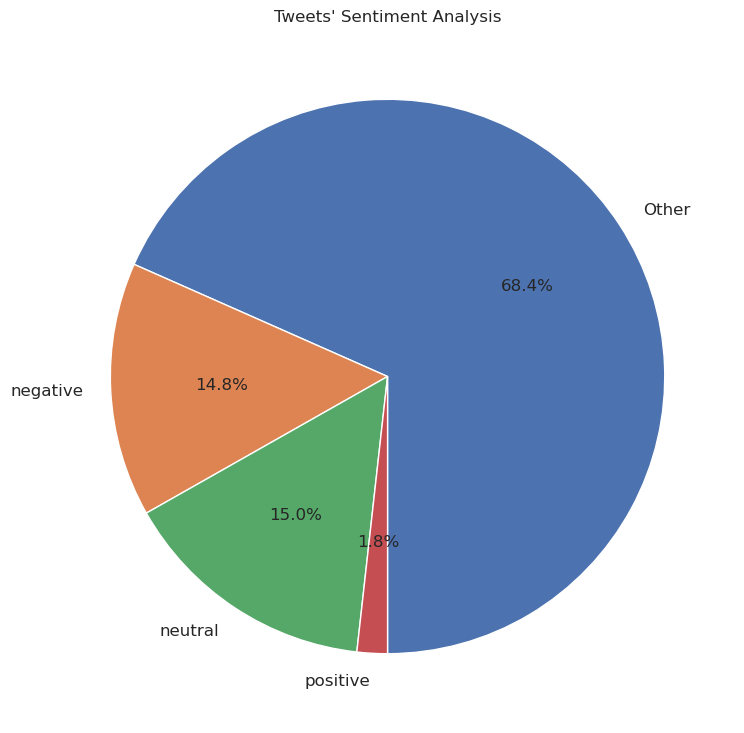

In [12]:
fig = plt.figure(figsize=(16,9), dpi=100)
ax = plt.subplot(111)
plt.title("Tweets' Sentiment Analysis")
sentiment_counts.plot.pie(ax=ax, autopct='%1.1f%%', startangle=270, fontsize=12, label="")
plt.savefig("Tweets_Sentiment_pie.jpg")

### Show a handles' sentiment

In [15]:
#display(df[df["Cancel"]==1][["Cancel", "Sentiment"]].groupby("Cancel").agg([np.mean, np.max, np.min, np.median]))
#display(df[df["Pedophilia"]==1][["Pedophilia", "Sentiment"]].groupby("Pedophilia").agg([np.mean, np.max, np.min, np.median]))
#display(df[df["QAnon"]==1][["QAnon", "Sentiment"]].groupby("QAnon").agg([np.mean, np.max, np.min, np.median]))

In [16]:
sentiment_cancel_counts = df.groupby(["Cancel","Sentiment"]).size()
print(sentiment_cancel_counts)

Cancel  Sentiment
0       Other        685
        negative     150
        neutral      152
        positive      18
1       Other         11
        negative       1
        neutral        1
dtype: int64


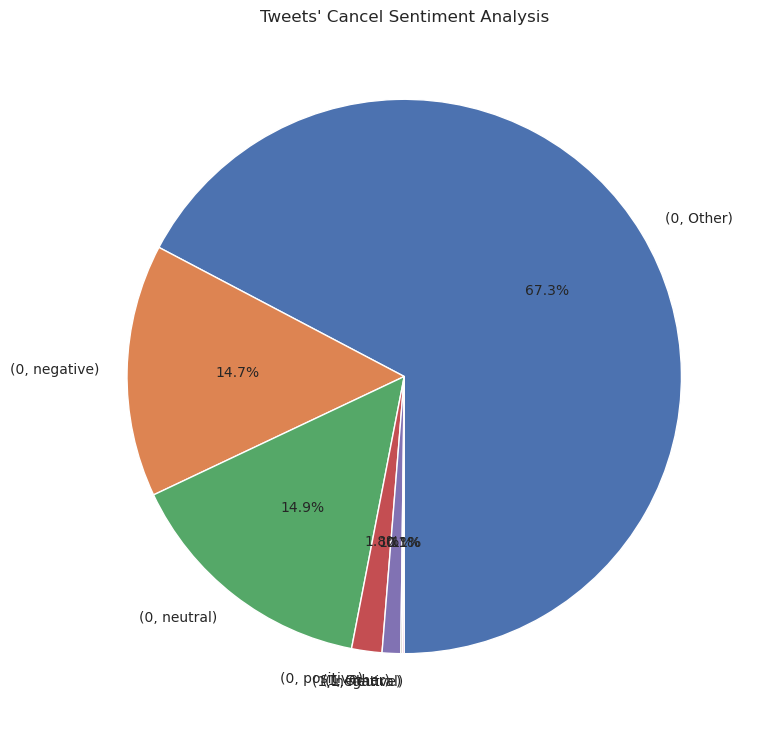

In [23]:
fig = plt.figure(figsize=(16,9), dpi=100)
ax = plt.subplot(111)
plt.title("Tweets' Cancel Sentiment Analysis")
sentiment_cancel_counts.plot.pie(ax=ax, autopct='%1.1f%%', startangle=270, fontsize= 10, label="")
plt.savefig("Tweets_Cancel_Sentiment_pie.jpg")

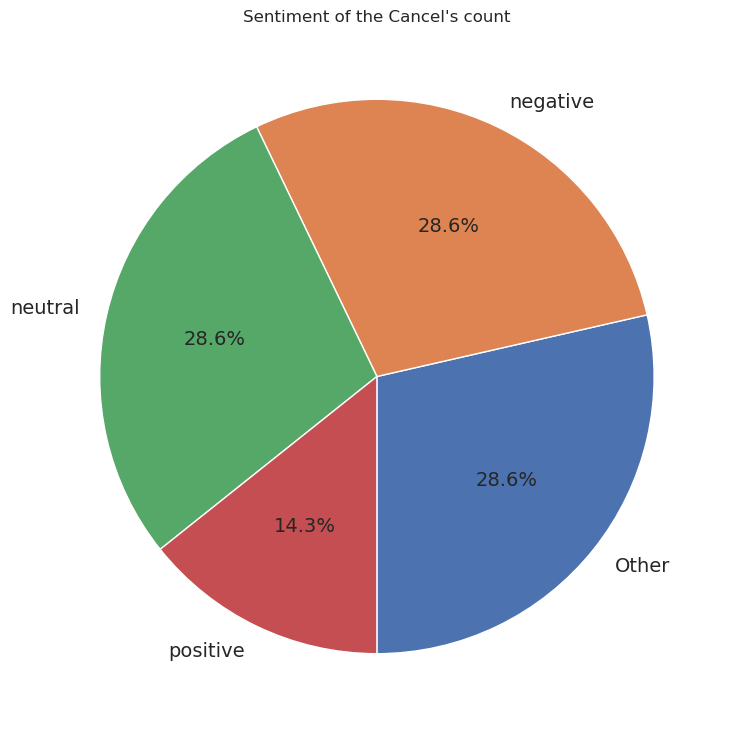

In [33]:
cancel = df[["Cancel", "Sentiment"]].groupby(["Sentiment","Cancel"]).count()
cancel = pd.DataFrame(cancel)
cancel = cancel.groupby(["Sentiment"]).size()
fig = plt.figure(figsize=(16,9), dpi=100)
ax = plt.subplot(111)
plt.title("Sentiment of the Cancel's count")
cancel.plot.pie(ax=ax, autopct="%1.1f%%", startangle=  270, fontsize = 14, label= "")
plt.savefig("cancelCount_Sentiment_pie.jpg")

In [17]:
sentiment_pedophilia_counts = df.groupby(["Pedophilia","Sentiment"]).size()
print(sentiment_pedophilia_counts)

Pedophilia  Sentiment
0           Other        658
            negative     134
            neutral      153
            positive      18
1           Other         38
            negative      17
dtype: int64


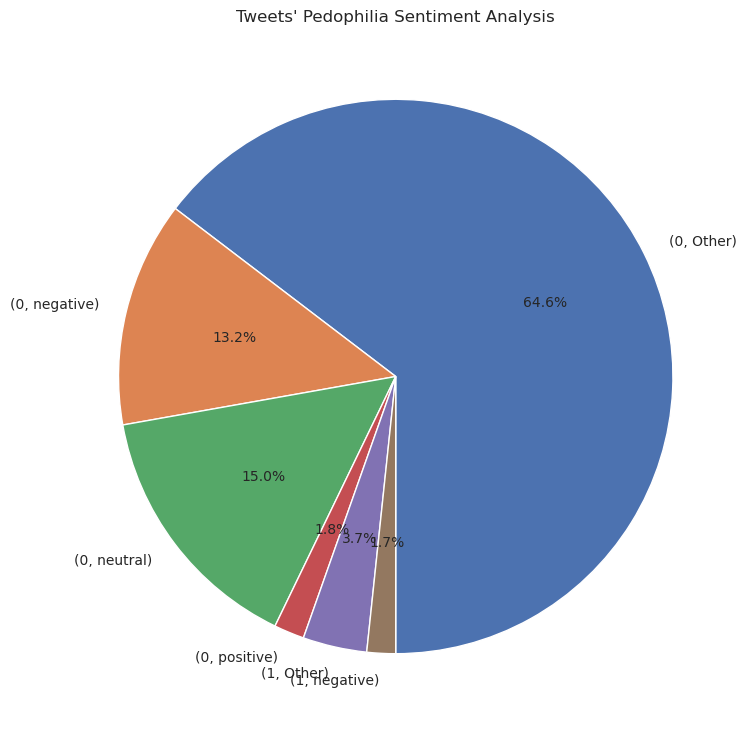

In [24]:
fig = plt.figure(figsize=(16,9), dpi=100)
ax = plt.subplot(111)
plt.title("Tweets' Pedophilia Sentiment Analysis")
sentiment_pedophilia_counts.plot.pie(ax=ax, autopct='%1.1f%%', startangle=270, fontsize= 10, label="")
plt.savefig("Tweets_Pedophilia_Sentiment_pie.jpg")

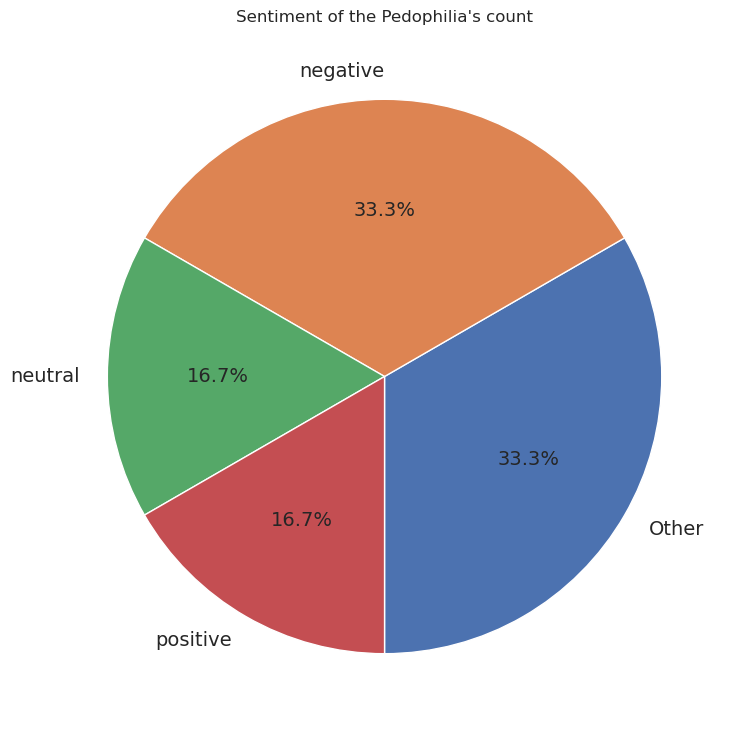

In [34]:
pedophilia = df[["Pedophilia", "Sentiment"]].groupby(["Sentiment","Pedophilia"]).count()
pedophilia = pd.DataFrame(pedophilia)
pedophilia = pedophilia.groupby(["Sentiment"]).size()
fig = plt.figure(figsize=(16,9), dpi=100)
ax = plt.subplot(111)
plt.title("Sentiment of the Pedophilia's count")
pedophilia.plot.pie(ax=ax, autopct="%1.1f%%", startangle=  270, fontsize = 14, label= "")
plt.savefig("pedophiliaCount_Sentiment_pie.jpg")

In [18]:
sentiment_QAnon_counts = df.groupby(["QAnon","Sentiment"]).size()
print(sentiment_QAnon_counts)

QAnon  Sentiment
0      Other        696
       negative     151
       neutral      152
       positive      18
1      neutral        1
dtype: int64


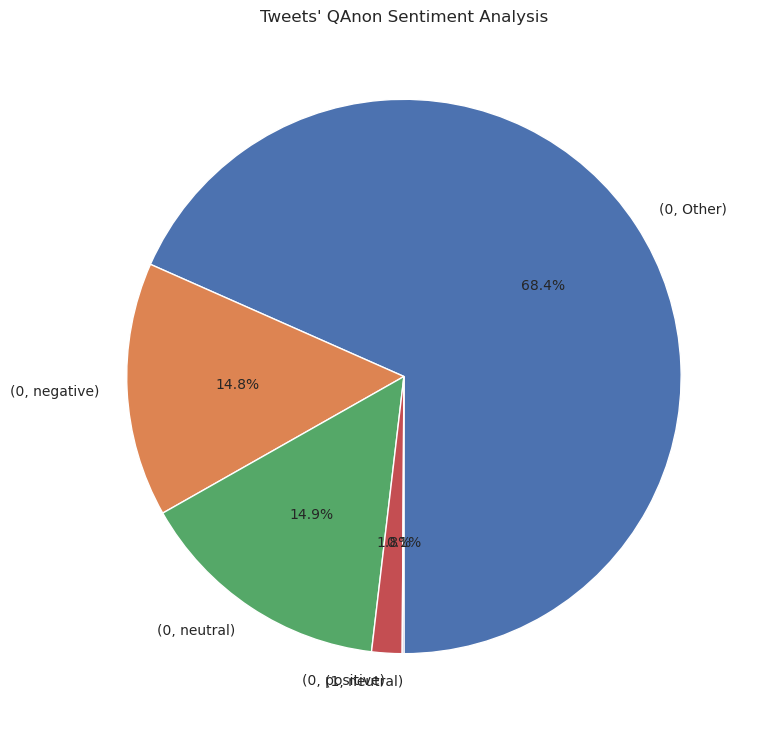

In [25]:
fig = plt.figure(figsize=(16,9), dpi=100)
ax = plt.subplot(111)
plt.title("Tweets' QAnon Sentiment Analysis")
sentiment_QAnon_counts.plot.pie(ax=ax, autopct='%1.1f%%', startangle=270, fontsize= 10, label="")
plt.savefig("Tweets_QAnon_Sentiment_pie.jpg")

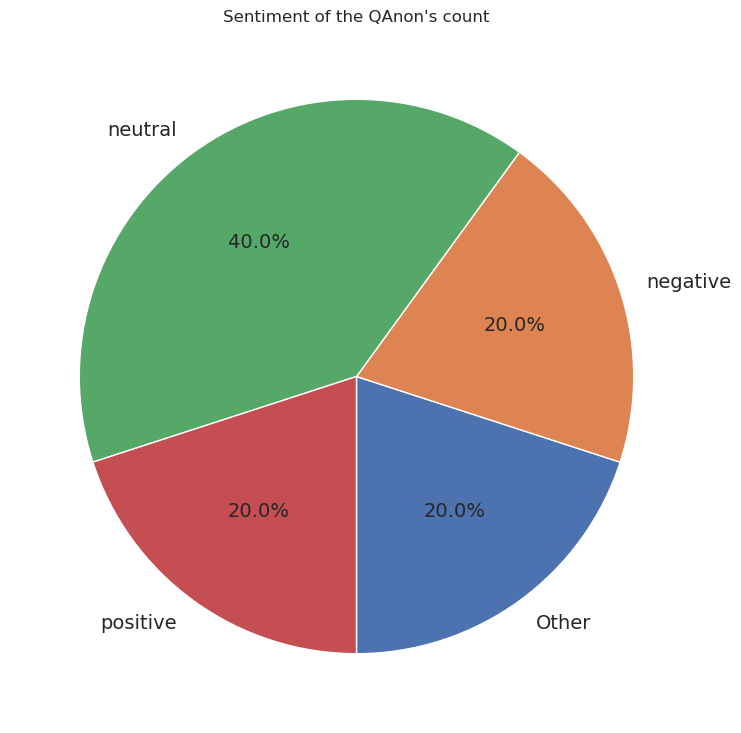

In [35]:
qanon = df[["QAnon", "Sentiment"]].groupby(["Sentiment","QAnon"]).count()
qanon = pd.DataFrame(qanon)
qanon = qanon.groupby(["Sentiment"]).size()
fig = plt.figure(figsize=(16,9), dpi=100)
ax = plt.subplot(111)
plt.title("Sentiment of the QAnon's count")
qanon.plot.pie(ax=ax, autopct="%1.1f%%", startangle=  270, fontsize = 14, label= "")
plt.savefig("qanonCount_Sentiment_pie.jpg")

### Show likes & retweets sentiment

#### Likes

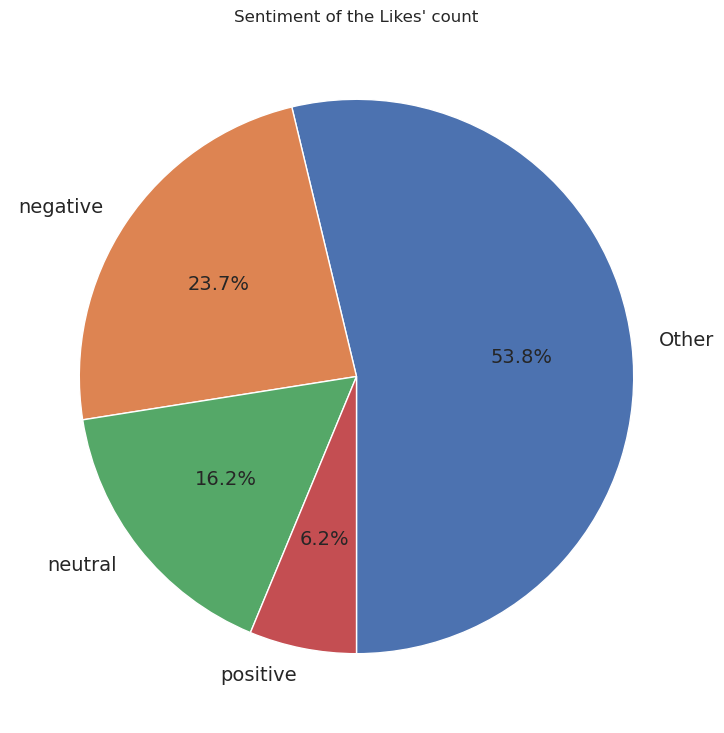

In [26]:
likes = df[["Likes", "Sentiment"]].groupby(["Sentiment","Likes"]).count()
likes = pd.DataFrame(likes)
likes = likes.groupby(["Sentiment"]).size()
fig = plt.figure(figsize=(16,9), dpi=100)
ax = plt.subplot(111)
plt.title("Sentiment of the Likes' count")
likes.plot.pie(ax=ax, autopct="%1.1f%%", startangle=  270, fontsize = 14, label= "")
plt.savefig("likesCount_Sentiment_pie.jpg")

In [27]:
sentiment_likes_counts = df[["Likes","Sentiment"]].groupby(["Sentiment","Likes"]).size()
print(sentiment_likes_counts)

Sentiment  Likes
Other      0        401
           1        123
           2         53
           3         26
           4         18
                   ... 
positive   0         12
           1          3
           6          1
           8          1
           19         1
Length: 80, dtype: int64


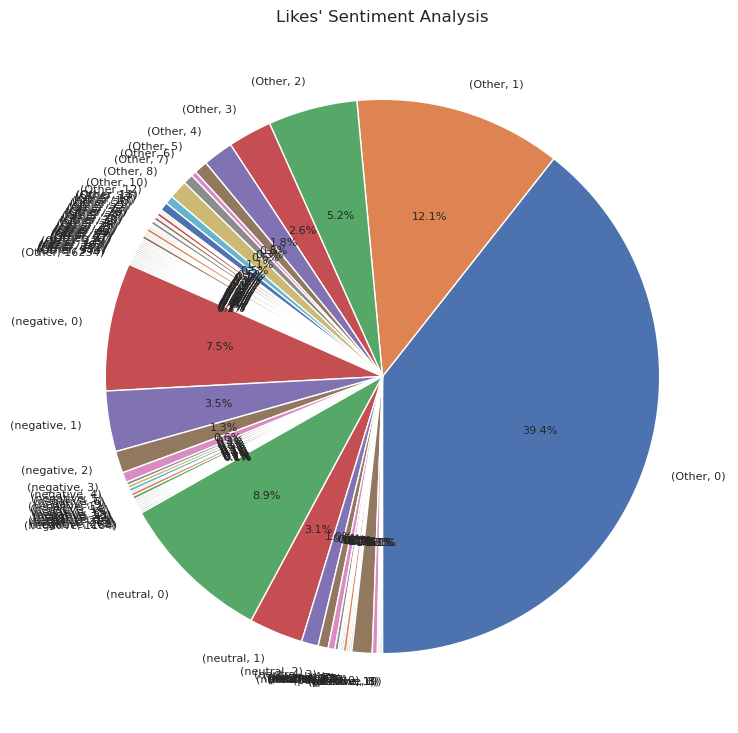

In [28]:
fig = plt.figure(figsize=(16,9), dpi=100)
ax = plt.subplot(111)
plt.title("Likes' Sentiment Analysis")
sentiment_likes_counts.plot.pie(ax=ax, autopct='%1.1f%%', startangle=270, fontsize=8, label= "")
plt.savefig("Likes_Sentiment_pie.jpg")

#### Retweets

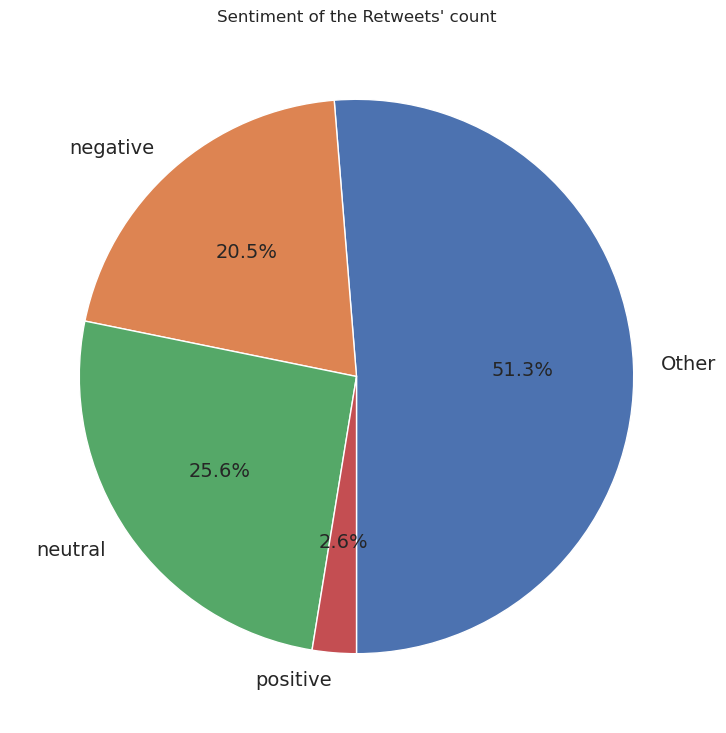

In [29]:
retweets = df[["Retweets", "Sentiment"]].groupby(["Sentiment","Retweets"]).count()
retweets = pd.DataFrame(retweets)
retweets = retweets.groupby(["Sentiment"]).size()
fig = plt.figure(figsize=(16,9), dpi=100)
ax = plt.subplot(111)
plt.title("Sentiment of the Retweets' count")
retweets.plot.pie(ax=ax, autopct="%1.1f%%", startangle=  270, fontsize = 14, label= "")
plt.savefig("retweetsCount_Sentiment_pie.jpg")

In [30]:
sentiment_rt_counts = df[["Retweets","Sentiment"]].groupby(["Sentiment","Retweets"]).size()
print(sentiment_rt_counts)

Sentiment  Retweets
Other      0           610
           1            42
           2            12
           3             6
           4             6
           5             4
           6             2
           7             2
           8             1
           11            1
           13            1
           19            1
           23            1
           25            1
           26            1
           47            1
           89            1
           110           1
           313           1
           6696          1
negative   0           129
           1            11
           2             3
           3             4
           7             1
           68            1
           97            1
           374           1
neutral    0           137
           1             6
           2             2
           3             2
           7             1
           21            1
           33            1
           85            1
        

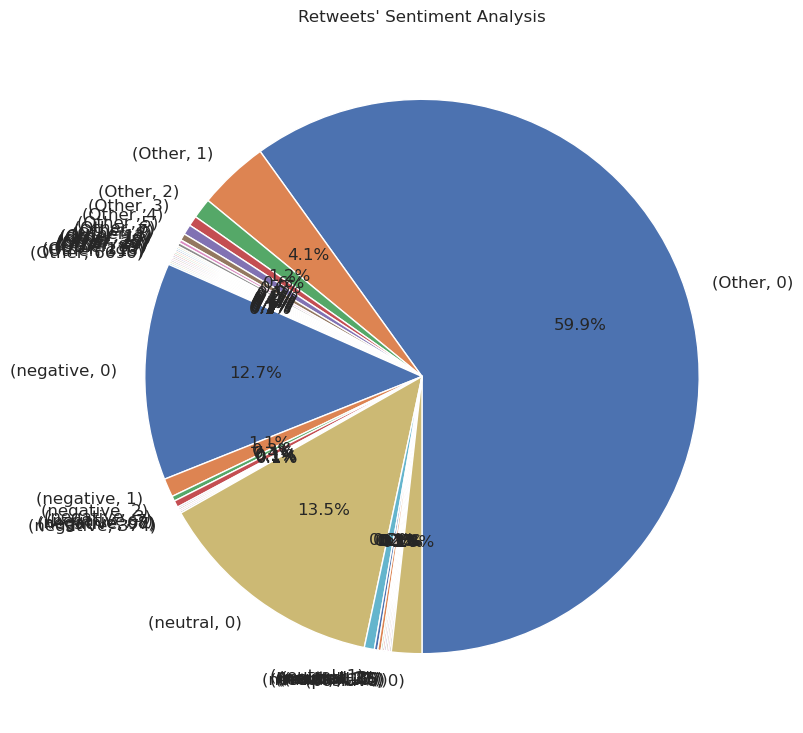

In [31]:
fig = plt.figure(figsize=(16,9), dpi=100)
ax = plt.subplot(111)
plt.title("Retweets' Sentiment Analysis")
sentiment_rt_counts.plot.pie(ax=ax, autopct='%1.1f%%', startangle=270, fontsize = 12, label= "")
plt.savefig("Retweets_Sentiment_pie.jpg")

### Wordclouds

#### Processed tweets

In [153]:
#df.head()

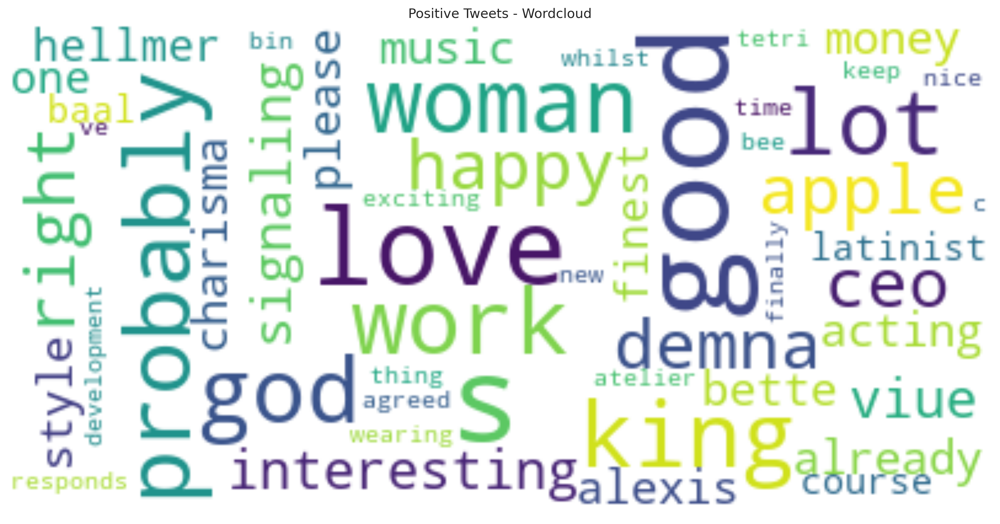

<Figure size 640x480 with 0 Axes>

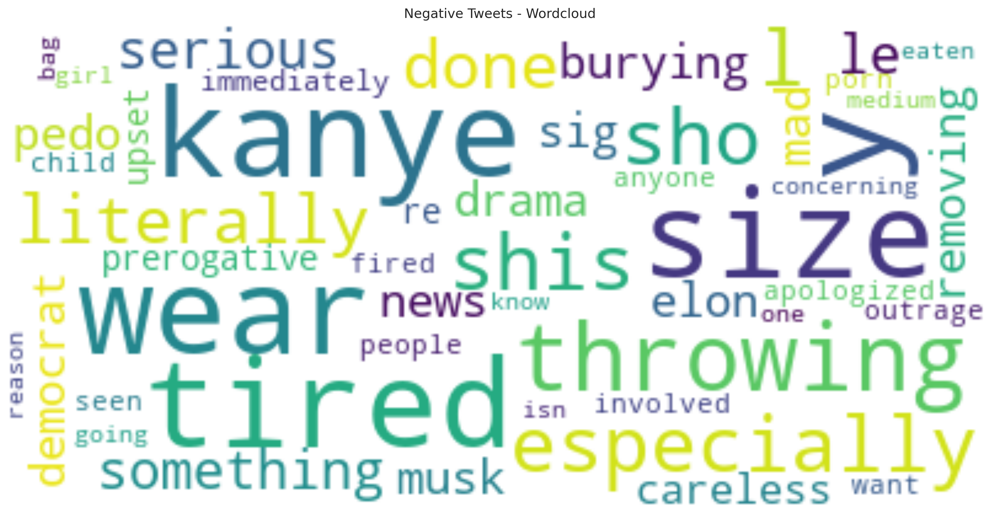

<Figure size 640x480 with 0 Axes>

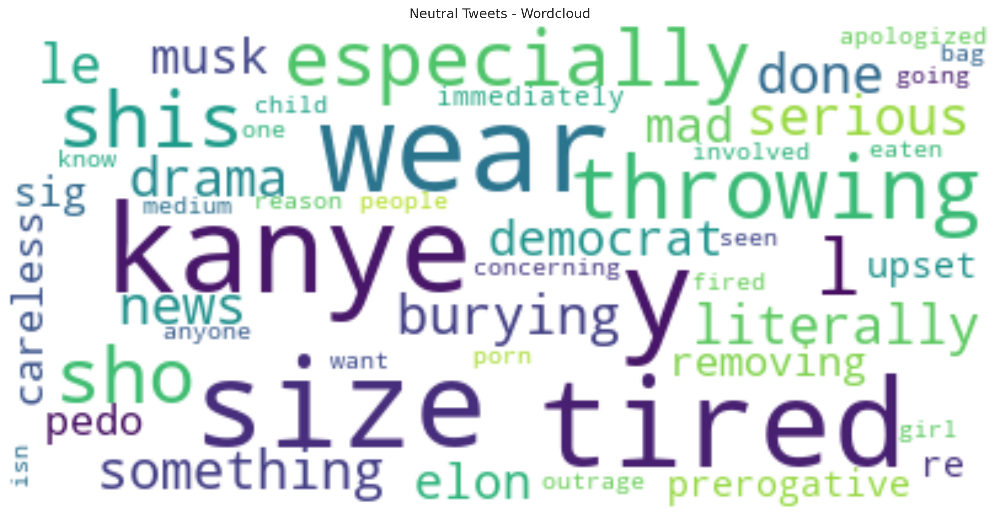

<Figure size 640x480 with 0 Axes>

In [46]:
from wordcloud import WordCloud
from wordcloud import STOPWORDS

# Wordcloud with positive tweets
positive_tweets = df["Processed_tweets"][df["Sentiment"] == "positive"]
stop_words = ["https", "co", "httpstco",  "RT"] + list(STOPWORDS)
positive_wordcloud = WordCloud(max_font_size=50, max_words=50, background_color="white", stopwords = stop_words).generate(str(positive_tweets))
plt.figure(figsize = (16, 12), dpi = 300)
plt.title("Positive Tweets - Wordcloud")
plt.imshow(positive_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()
plt.savefig("positive_wordcloud.png")
 
# Wordcloud with negative tweets
negative_tweets = df["Processed_tweets"][df["Sentiment"] == 'negative']
stop_words = ["https", "co", "httpstco",  "RT"] + list(STOPWORDS)
negative_wordcloud = WordCloud(max_font_size=50, max_words=50, background_color="white", stopwords = stop_words).generate(str(negative_tweets))
plt.figure(figsize = (16, 12), dpi = 300)
plt.title("Negative Tweets - Wordcloud")
plt.imshow(negative_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()
plt.savefig("negative_wordcloud.png")
 

# Wordcloud with neutral tweets
neutral_tweets = df["Processed_tweets"][df["Sentiment"] == 'neutral']
stop_words = ["https", "co", "httpstco", "RT"] + list(STOPWORDS)
neutral_wordcloud = WordCloud(max_font_size=50, max_words=50, background_color="white", stopwords = stop_words).generate(str(negative_tweets))
plt.figure(figsize = (16, 12), dpi = 300)
plt.title("Neutral Tweets - Wordcloud")
plt.imshow(neutral_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()
plt.savefig("neutral_wordcloud.png")

#### Hastags

In [47]:
HT_positive = []
HT_negative = []
HT_neutral = []

In [48]:
def hashtag_extract(x):
    hashtags = []
    # Loop over the words in the tweet
    for i in x:
        ht = re.findall(r"#(\w+)", i)
        hashtags.append(ht)
    return hashtags

In [49]:
# extracting hashtags from positive tweetsHT_positive = hashtag_extract(df_tws['text'][df_tws['sent'] == 1])
# extracting hashtags from  tweets
HT_positive = hashtag_extract(df["Text"][df["Sentiment"] == "positive"])
HT_negative = hashtag_extract(df["Text"][df["Sentiment"] == "negative"])
HT_neutral = hashtag_extract(df["Text"][df["Sentiment"] == "neutral"])
# unnesting list
HT_positive = sum(HT_positive,[])
HT_negative = sum(HT_negative,[])
HT_neutral = sum(HT_neutral,[])

In [50]:
HT_positive 

['balenciaga', 'kimkardashian', 'Balenciaga', 'rnagraphy', 'Balenciaga']

In [51]:
HT_negative

['Lotta',
 'LottaVolkova',
 'BalenciagaGate',
 'Balenciaga',
 'Balenciaga',
 'Balenciaga',
 'Balenciagapedos',
 'balenciaga',
 'BalenciagaGate',
 'BalenciagaPedofilia',
 'Balenciaga',
 'NicoleKidman',
 'SilenceIsDeafening',
 'Balenciaga',
 'loveiscorrection',
 'Balenciaga',
 'childtrafficking',
 'whatsinthebag',
 'savethechildren',
 'WorldCup',
 'cancelbalenciaga',
 'burnbalenciaga',
 'instagram',
 'Balenciaga',
 'KimKardashian',
 'BalenciagaGate',
 'BalenciagaGate',
 'Balenciaga',
 'balenciaga',
 'KanyeWest',
 'ye',
 'Balenciaga',
 'Balenciaga',
 'Balenciaga',
 'Nike',
 'Balenciaga',
 'AlBUCKquerque',
 'balenciaga',
 'thanksgiving',
 'slavery',
 'BALENCIAGA',
 'hitler',
 'america',
 'natives',
 'blacks',
 'kanye',
 'boycottadidas',
 'BalenciagaGate',
 'Balenciaga',
 'Balenciaga',
 'Balenciaga',
 'BalenciagaGate',
 'cancelNicolekidman',
 'Balenciaga',
 'mikevick',
 'dogs']

In [52]:
HT_neutral

['75',
 'balenciaga',
 'hollywood',
 'Balenciaga',
 'fakenews',
 'LottaVolkova',
 'Pinault',
 'Kering',
 'Balenciaga',
 'BalenciagaGate',
 'Balenciaga',
 'Vetements',
 'DemnaGvasalia',
 'Balenciaga',
 'Balenciaga',
 'ShineALight',
 'lightothedarkness',
 'FashionGate',
 'BalenciagaGate',
 'Balenciaga',
 'truth',
 'Balenciaga',
 'moneymatters',
 'Balenciaga',
 'ye',
 'balenciaga',
 'BALENCIAGA',
 'Balenciaga',
 'Balenciaga',
 'Balenciaga',
 'BalenciagaAdidas',
 'childexploitation',
 'Balenciaga',
 'BreakingNews',
 'conservative',
 'ConservativeNews',
 'trump',
 'republican',
 'BalenciagaGate',
 'Balenciaga',
 'BalenciagaGroomers',
 'Burnbalenciaga',
 'Balenciaga']

In [63]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

def word_cloud(wd_list):
    stopwords = set(STOPWORDS)
    all_words = ' '.join([text for text in wd_list])
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        width=1600,
        height=800,
        random_state=1,
        colormap='jet',
        max_words=100,
        max_font_size=200).generate(all_words)
    plt.figure(figsize=(12, 10))
    plt.axis('off')
    plt.imshow(wordcloud, interpolation="bilinear")
    return plt.savefig('wd_list.png')#, bbox_inches = "tight", pad_inches=.5)

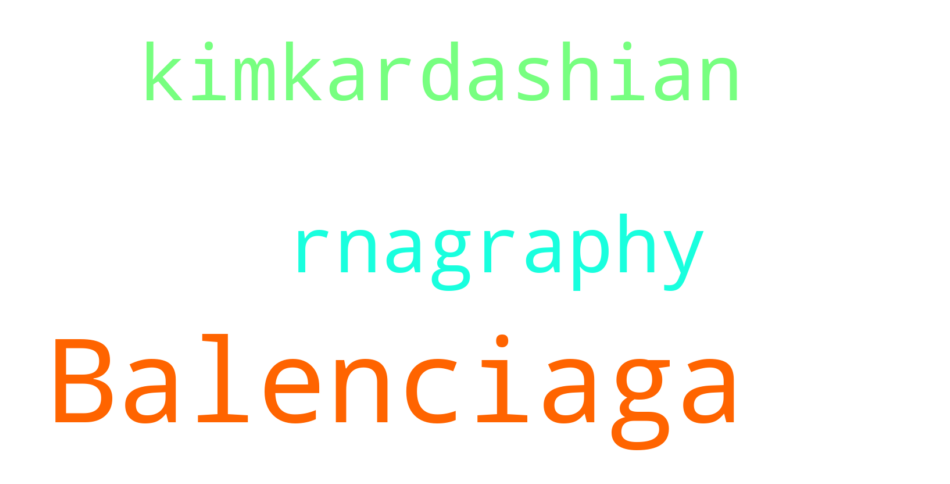

In [67]:
word_cloud(HT_positive)

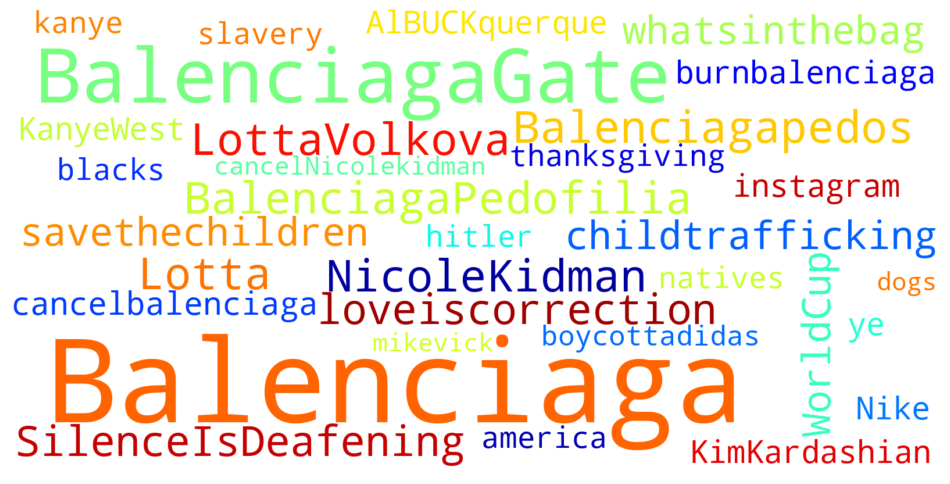

In [68]:
word_cloud(HT_negative)

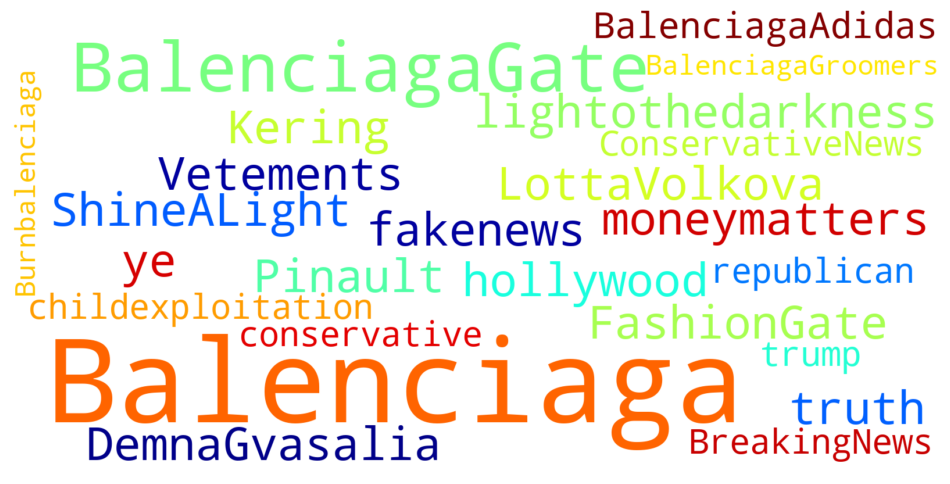

In [69]:
word_cloud(HT_neutral)